<a href="https://colab.research.google.com/github/jakless/mgr2024/blob/main/Model_20240605.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **ROZPAKOWYWANIE**

In [ ]:
import zipfile

def unzip_file(zip_file_path, extract_to_path):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to_path)

# Przykładowe użycie funkcji:
zip_file_path = '/content/images.zip'
extract_to_path = '/content/images'
unzip_file(zip_file_path, extract_to_path)


## **USUWANIE ELEMENTÓW FOLDERU**

In [ ]:
import os

# Ścieżka do folderu, który chcemy oczyścić
folder_path = '/content/yolo'

# Usunięcie wszystkich plików z folderu
for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    try:
        if os.path.isfile(file_path) or os.path.islink(file_path):
            os.unlink(file_path)
        elif os.path.isdir(file_path):
            os.rmdir(file_path)
    except Exception as e:
        print(f"Failed to delete {file_path}. Reason: {e}")


### **PAKOWANIE W ZIPA**

In [ ]:
import shutil
import os

# Ścieżka do folderu do spakowania
folder_to_zip = '/content/yolo'

# Ścieżka, pod którą chcesz zapisać plik zip
output_zip_file = '/content/yolo'

# Spakowanie folderu
shutil.make_archive(output_zip_file, 'zip', folder_to_zip)

# Sprawdzenie, czy plik zip został utworzony
if os.path.exists(output_zip_file):
    print("Plik zip został utworzony pomyślnie.")
else:
    print("Wystąpił problem podczas tworzenia pliku zip.")


Plik zip został utworzony pomyślnie.


#**EFFICIENT_NET**

## **1. WCZYTANIE MODELU**

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Wczytanie wytrenowanego modelu
model = load_model("efficientnet_model.h5")

# Funkcja do przetwarzania obrazu
def preprocess_image(image_path):
    # Wczytanie obrazu
    image = load_img(image_path, target_size=(224, 224))
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)

    # Przetworzenie obrazu do formatu akceptowanego przez model EfficientNet
    image = preprocess_input(image)

    return image

# Wczytanie obrazu do przetwarzania
image_path = '/content/images/train/zdjecie1.jpg'  # Zmień na ścieżkę do swojego obrazu
image = preprocess_image(image_path)

# Przewidywanie etykiet dla obrazu
predictions = model.predict(image)

# Określenie progu dla prawdopodobieństwa
threshold = 0.5

# Wyświetlanie wyników przewidywań
print("Wyniki przewidywań:")
print(predictions)

# Wczytanie obrazu do wyświetlenia
image_display = cv2.imread(image_path)
image_display = cv2.cvtColor(image_display, cv2.COLOR_BGR2RGB)

# Znalezienie obszaru z najwyższym prawdopodobieństwem dla klasy "GREY"
grey_class_index = label_encoder.index('GREY')
grey_class_activation = model.layers[-2].output[:, grey_class_index]

# Znalezienie współrzędnych maksymalnej aktywacji
activation_map = tf.squeeze(grey_class_activation)
activation_map = tf.nn.max_pool2d(activation_map[None,None,...], 10, 1, padding='SAME')

# Utworzenie funkcji TensorFlow
@tf.function
def get_activation_map_value():
    return activation_map

# Pobranie wartości tensora w kontekście TensorFlow
activation_map_value = get_activation_map_value()

# Znalezienie współrzędnych maksymalnej aktywacji
ymax, xmax = np.unravel_index(np.argmax(np.reshape(activation_map_value, (-1,))), activation_map_value.shape[1:])
xmin, ymin = xmax - 224, ymax - 224  # Oblicz współrzędne rogu górnego lewego

# Wydrukuj lokalizację wykrytego elementu "GREY"
print(f"Współrzędne dla GREY: (xmin={xmin}, ymin={ymin}), (xmax={xmax}, ymax={ymax})")

# Zaznaczenie wykrytego obiektu za pomocą prostokąta
cv2.rectangle(image_display, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)

# Wyświetlenie obrazu
from google.colab.patches import cv2_imshow
cv2_imshow(image_display)


## **2. KOD WYSZUKUJĄCY WSZYSTKIE ETYKIETY I ELEMENTY**

## 2.1 Accuracy: 0.38 Precision: 1.0 Recall: 0.38 F1 Score: 0.55 Confusion Matrix:[[19 31][ 0  0]]

In [ ]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import cv2
from sklearn.preprocessing import MultiLabelBinarizer
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


# Funkcja do parsowania pliku XML
def parse_xml_annotation(xml_file_path):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    # Inicjalizacja listy dla opisów obiektów
    annotations = []

    # Iteracja po każdym obiekcie w pliku XML
    for obj in root.findall('object'):
        # Pobranie nazwy klasy obiektu
        class_name = obj.find('name').text

        # Pobranie współrzędnych obrysu obiektu
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        # Dodanie opisu obiektu do listy
        annotations.append({'class_name': class_name,
                            'xmin': xmin,
                            'ymin': ymin,
                            'xmax': xmax,
                            'ymax': ymax})

    return annotations

# Ścieżki do folderów z obrazami treningowymi i walidacyjnymi
train_dir = '/content/images/train'
valid_dir = '/content/images/valid'

# Inicjalizacja list dla danych treningowych i walidacyjnych
train_images = []
train_labels = []
valid_images = []
valid_labels = []

# Wczytanie danych obrazów i ich opisów dla danych treningowych
for image_name in os.listdir(train_dir):
    if image_name.endswith('.jpg'):
        image_path = os.path.join(train_dir, image_name)
        xml_file_path = os.path.join(train_dir, image_name.replace('.jpg', '.xml'))

        # Wczytanie obrazu
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Wczytanie opisów obiektów
        annotations = parse_xml_annotation(xml_file_path)

        # Przetworzenie obrazu
        image = cv2.resize(image, (224, 224))
        image = img_to_array(image)
        image = preprocess_input(image)

        # Dodanie obrazu i etykiet do listy danych treningowych
        train_images.append(image)
        train_labels.append([annotation['class_name'] for annotation in annotations])

# Konwersja list na tablice numpy
train_images = np.array(train_images, dtype='float32')

# Przekonwertowanie etykiet na wektory "one-hot" za pomocą MultiLabelBinarizer
label_binarizer = MultiLabelBinarizer()
train_labels_encoded = label_binarizer.fit_transform(train_labels)

# Budowa modelu EfficientNetB0
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Dodanie warstw do wyjścia modelu
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Dodanie warstwy Dropout
output = Dense(len(label_binarizer.classes_), activation='softmax')(x)

# Tworzenie końcowego modelu
model = Model(inputs=base_model.input, outputs=output)

# Kompilacja modelu
optimizer = Adam(lr=0.001)  # Zmiana współczynnika uczenia
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Trenowanie modelu
history = model.fit(train_images, train_labels_encoded, epochs=20, batch_size=64)  # Zmiana liczby epok i rozmiaru partii

# Zapis modelu do pliku HDF5
model.save("efficientnet_model.h5")

# Zapis modelu do pliku KERAS
model.save("efficientnet_model.keras")

# Odczytanie danych walidacyjnych
valid_images = []
valid_labels = []

for image_name in os.listdir(valid_dir):
    if image_name.endswith('.jpg'):
        image_path = os.path.join(valid_dir, image_name)
        xml_file_path = os.path.join(valid_dir, image_name.replace('.jpg', '.xml'))

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (224, 224))
        image = img_to_array(image)
        image = preprocess_input(image)

        valid_images.append(image)
        valid_labels.append([annotation['class_name'] for annotation in parse_xml_annotation(xml_file_path)])

valid_images = np.array(valid_images, dtype='float32')
valid_labels_encoded = label_binarizer.transform(valid_labels)

# Ocena modelu na danych walidacyjnych
valid_predictions = model.predict(valid_images)
valid_predictions_classes = np.argmax(valid_predictions, axis=1)

accuracy = accuracy_score(np.argmax(valid_labels_encoded, axis=1), valid_predictions_classes)
precision = precision_score(np.argmax(valid_labels_encoded, axis=1), valid_predictions_classes, average='weighted')
recall = recall_score(np.argmax(valid_labels_encoded, axis=1), valid_predictions_classes, average='weighted')
f1 = f1_score(np.argmax(valid_labels_encoded, axis=1), valid_predictions_classes, average='weighted')
conf_matrix = confusion_matrix(np.argmax(valid_labels_encoded, axis=1), valid_predictions_classes)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)


## DEEP AI
AKTUALNIE TESTOWANY


In [ ]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import cv2
from sklearn.preprocessing import MultiLabelBinarizer
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Funkcja do parsowania pliku XML
def parse_xml_annotation(xml_file_path):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    # Inicjalizacja listy dla opisów obiektów
    annotations = []

    # Iteracja po każdym obiekcie w pliku XML
    for obj in root.findall('object'):
        # Pobranie nazwy klasy obiektu
        class_name = obj.find('name').text

        # Pobranie współrzędnych obrysu obiektu
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        # Dodanie opisu obiektu do listy
        annotations.append({'class_name': class_name,
                            'xmin': xmin,
                            'ymin': ymin,
                            'xmax': xmax,
                            'ymax': ymax})

    return annotations

# Funkcja do przetwarzania obrazu i odczytywania etykiet oraz współrzędnych zaznaczonych obszarów
def process_image(image_path, xml_file_path):
    # Wczytanie obrazu
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Wczytanie opisów obiektów z pliku XML
    annotations = parse_xml_annotation(xml_file_path)

    # Przetworzenie obrazu
    image_processed = cv2.resize(image, (224, 224))
    image_processed = img_to_array(image_processed)
    image_processed = preprocess_input(image_processed)

    # Inicjalizacja listy dla etykiet i współrzędnych zaznaczonych obszarów
    labels = []
    coordinates = []

    # Dodanie informacji o etykietach i współrzędnych
    for annotation in annotations:
        label = annotation['class_name']
        xmin = annotation['xmin']
        ymin = annotation['ymin']
        xmax = annotation['xmax']
        ymax = annotation['ymax']

        labels.append(label)
        coordinates.append((xmin, ymin, xmax, ymax))

    # Przewidywanie etykiet i współrzędnych dla obrazu
    predictions = model.predict(np.expand_dims(image_processed, axis=0))
    predicted_labels = label_binarizer.classes_[predictions[0] > 0.5]  # Próg 0.5

    # Tworzenie katalogu "predictions", jeśli nie istnieje
    predictions_dir = 'predictions'
    if not os.path.exists(predictions_dir):
        os.makedirs(predictions_dir)

    # Zapis przewidywanych współrzędnych do pliku tekstowego
    for label, coord in zip(predicted_labels, coordinates):
        prediction_file_path = os.path.join(predictions_dir, f'{os.path.splitext(os.path.basename(image_path))[0]}_{label}.txt')
        with open(prediction_file_path, 'w') as f:
            f.write(' '.join(map(str, coord)))

    return image_processed, labels, coordinates

# Ścieżki do folderów z obrazami treningowymi i walidacyjnymi
train_dir = '/content/images/train'
valid_dir = '/content/images/valid'

# Inicjalizacja list dla danych treningowych i walidacyjnych
train_images = []
train_labels = []
train_coordinates = []
valid_images = []
valid_labels = []
valid_coordinates = []

# Przetwarzanie danych treningowych
for image_name in os.listdir(train_dir):
    if image_name.endswith('.jpg'):
        image_path = os.path.join(train_dir, image_name)
        xml_file_path = os.path.join(train_dir, image_name.replace('.jpg', '.xml'))

        # Przetworzenie obrazu i odczytanie etykiet oraz współrzędnych zaznaczonych obszarów
        image_processed, labels, coordinates = process_image(image_path, xml_file_path)

        # Dodanie obrazu i etykiet do listy danych treningowych
        train_images.append(image_processed)
        train_labels.append(labels)
        train_coordinates.append(coordinates)

# Konwersja list na tablice numpy
train_images = np.array(train_images, dtype='float32')

# Przekonwertowanie etykiet na wektory "one-hot" za pomocą MultiLabelBinarizer
label_binarizer = MultiLabelBinarizer()
train_labels_encoded = label_binarizer.fit_transform(train_labels)

# Budowa modelu EfficientNetB0
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Dodanie warstw do wyjścia modelu
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Dodanie warstwy Dropout
output_classes = Dense(len(label_binarizer.classes_), activation='sigmoid')(x)

# Tworzenie końcowego modelu
model = Model(inputs=base_model.input, outputs=output_classes)

# Kompilacja modelu
optimizer = Adam(learning_rate=0.001)  # Zmiana współczynnika uczenia
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Trenowanie modelu
history = model.fit(train_images, train_labels_encoded, epochs=1, batch_size=10)  # Zmiana liczby epok i rozmiaru partii

# Zapis modelu do pliku HDF5
model.save("efficientnet_model.h5")

# Zapis modelu do pliku KERAS
model.save("efficientnet_model.keras")



# Odczytanie danych walidacyjnych
true_labels_all = []  # Lista prawdziwych etykiet dla wszystkich obrazów
true_coordinates_all = []  # Lista współrzędnych zaznaczonych obszarów dla wszystkich obrazów
predicted_labels_all = []  # Lista przewidywanych etykiet dla wszystkich obrazów
predicted_coordinates_all = []  # Lista przewidywanych współrzędnych dla wszystkich obrazów

for image_name in os.listdir(valid_dir):
    if image_name.endswith('.jpg'):
        image_path = os.path.join(valid_dir, image_name)
        xml_file_path = os.path.join(valid_dir, image_name.replace('.jpg', '.xml'))

        # Przetworzenie obrazu i odczytanie etykiet oraz współrzędnych zaznaczonych obszarów
        image_processed, labels, coordinates, predicted_coordinates = process_image(image_path, xml_file_path)

        # Dodawanie informacji po parsowaniu pliku XML do list
        true_labels_all.extend(labels)
        true_coordinates_all.extend(coordinates)
        predicted_labels_all.extend(predicted_labels)
        predicted_coordinates_all.extend(predicted_coordinates)

# Przekształcenie prawdziwych etykiet do postaci kodowania "multilabel-indicator"
true_labels_encoded = label_binarizer.transform([[label] for label in true_labels_all])
predicted_labels_encoded = label_binarizer.transform(predicted_labels_all)

# Obliczenie metryk jakościowych
accuracy = accuracy_score(true_labels_encoded, predicted_labels_encoded)
precision = precision_score(true_labels_encoded, predicted_labels_encoded, average='micro')
recall = recall_score(true_labels_encoded, predicted_labels_encoded, average='micro')
f1 = f1_score(true_labels_encoded, predicted_labels_encoded, average='micro')
conf_matrix = confusion_matrix(true_labels_encoded.ravel(), predicted_labels_encoded.ravel())

# Wyświetlenie wyników
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)



### ROZSZERZENIE O WIĘCEJ PARAMETRÓW WYJŚCIOWYCH MODELU

In [ ]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import cv2
from sklearn.preprocessing import MultiLabelBinarizer
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Funkcja do parsowania pliku XML
def parse_xml_annotation(xml_file_path):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    # Inicjalizacja listy dla opisów obiektów
    annotations = []

    # Iteracja po każdym obiekcie w pliku XML
    for obj in root.findall('object'):
        # Pobranie nazwy klasy obiektu
        class_name = obj.find('name').text

        # Pobranie współrzędnych obrysu obiektu
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        # Dodanie opisu obiektu do listy
        annotations.append({'class_name': class_name,
                            'xmin': xmin,
                            'ymin': ymin,
                            'xmax': xmax,
                            'ymax': ymax})

    return annotations

# Funkcja do przetwarzania obrazu i odczytywania etykiet oraz współrzędnych zaznaczonych obszarów
def process_image(image_path, xml_file_path):
    # Wczytanie obrazu
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Wczytanie opisów obiektów z pliku XML
    annotations = parse_xml_annotation(xml_file_path)

    # Przetworzenie obrazu
    image_processed = cv2.resize(image, (224, 224))
    image_processed = img_to_array(image_processed)
    image_processed = preprocess_input(image_processed)

    # Inicjalizacja listy dla etykiet i współrzędnych zaznaczonych obszarów
    labels = []
    coordinates = []

    # Dodanie informacji o etykietach i współrzędnych
    for annotation in annotations:
        label = annotation['class_name']
        xmin = annotation['xmin']
        ymin = annotation['ymin']
        xmax = annotation['xmax']
        ymax = annotation['ymax']

        labels.append(label)
        coordinates.append((xmin, ymin, xmax, ymax))

    # Przewidywanie etykiet dla obrazu
    predictions = model.predict(np.expand_dims(image_processed, axis=0))
    predicted_labels = label_binarizer.classes_[predictions[0] > 0.5]  # Próg 0.5

    # Zapis przewidywanych współrzędnych do pliku TXT
    predictions_dir = 'predictions'
    if not os.path.exists(predictions_dir):
        os.makedirs(predictions_dir)

    for label, coord in zip(predicted_labels, coordinates):
        prediction_file_path = os.path.join(predictions_dir, f'{os.path.splitext(os.path.basename(image_path))[0]}_{label}.txt')
        with open(prediction_file_path, 'w') as f:
            f.write(' '.join(map(str, coord)))

    return image_processed, labels, coordinates

# Ścieżki do folderów z obrazami treningowymi i walidacyjnymi
train_dir = '/content/images/train'
valid_dir = '/content/images/valid'

# Inicjalizacja list dla danych treningowych i walidacyjnych
train_images = []
train_labels = []
train_coordinates = []
valid_images = []
valid_labels = []
valid_coordinates = []

# Przetwarzanie danych treningowych
for image_name in os.listdir(train_dir):
    if image_name.endswith('.jpg'):
        image_path = os.path.join(train_dir, image_name)
        xml_file_path = os.path.join(train_dir, image_name.replace('.jpg', '.xml'))

        # Przetworzenie obrazu i odczytanie etykiet oraz współrzędnych zaznaczonych obszarów
        image_processed, labels, coordinates = process_image(image_path, xml_file_path)

        # Dodanie obrazu i etykiet do listy danych treningowych
        train_images.append(image_processed)
        train_labels.append(labels)
        train_coordinates.append(coordinates)

# Konwersja list na tablice numpy
train_images = np.array(train_images, dtype='float32')

# Przekonwertowanie etykiet na wektory "one-hot" za pomocą MultiLabelBinarizer
label_binarizer = MultiLabelBinarizer()
train_labels_encoded = label_binarizer.fit_transform(train_labels)

# Budowa modelu EfficientNetB0
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Dodanie warstw do wyjścia modelu
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Dodanie warstwy Dropout
output = Dense(len(label_binarizer.classes_), activation='sigmoid')(x)

# Tworzenie końcowego modelu
model = Model(inputs=base_model.input, outputs=output)

# Kompilacja modelu
optimizer = Adam(learning_rate=0.001)  # Zmiana współczynnika uczenia
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Trenowanie modelu
history = model.fit(train_images, train_labels_encoded, epochs=1, batch_size=10)  # Zmiana liczby epok i rozmiaru partii

# Zapis modelu do pliku HDF5
model.save("efficientnet_model.h5")

# Zapis modelu do pliku KERAS
model.save("efficientnet_model.keras")

# Odczytanie danych walidacyjnych
true_labels_all = []  # Lista prawdziwych etykiet dla wszystkich obrazów
true_coordinates_all = []  # Lista współrzędnych zaznaczonych obszarów dla wszystkich obrazów
predicted_labels_all = []  # Lista przewidywanych etykiet dla wszystkich obrazów

for image_name in os.listdir(valid_dir):
    if image_name.endswith('.jpg'):
        image_path = os.path.join(valid_dir, image_name)
        xml_file_path = os.path.join(valid_dir, image_name.replace('.jpg', '.xml'))

        # Przetworzenie obrazu i odczytanie etykiet oraz współrzędnych zaznaczonych obszarów
        image_processed, labels, coordinates = process_image(image_path, xml_file_path)

        # Drukowanie informacji po parsowaniu pliku XML
        print("Parsed XML file:", xml_file_path)
        print("Labels:", labels)
        print("Coordinates:", coordinates)

        for label, coord in zip(labels, coordinates):
            true_labels_all.append(label)
            true_coordinates_all.append(coord)

            # Przewidywanie etykiety dla pojedynczego obiektu
            predictions = model.predict(np.expand_dims(image_processed, axis=0))
            predicted_label = label_binarizer.classes_[predictions[0] > 0.5]  # Próg 0.5
            predicted_labels_all.append(predicted_label)

# Przekształcenie prawdziwych etykiet do postaci kodowania "multilabel-indicator"
true_labels_encoded = label_binarizer.transform([[label] for label in true_labels_all])
predicted_labels_encoded = label_binarizer.transform(predicted_labels_all)

# Obliczenie metryk jakościowych
accuracy = accuracy_score(true_labels_encoded, predicted_labels_encoded)
precision = precision_score(true_labels_encoded, predicted_labels_encoded, average='micro')
recall = recall_score(true_labels_encoded, predicted_labels_encoded, average='micro')
f1 = f1_score(true_labels_encoded, predicted_labels_encoded, average='micro')
conf_matrix = confusion_matrix(true_labels_encoded.ravel(), predicted_labels_encoded.ravel())

# Wyświetlenie wyników
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)


### TEST PREDYKCJI MODELU

In [ ]:
import os
import cv2
import xml.etree.ElementTree as ET
import numpy as np
from keras.models import load_model
from google.colab.patches import cv2_imshow

# Ścieżka do danych walidacyjnych
validation_dir = "/content/images/valid/"

# Wczytaj model detekcji obiektów
model_path = "/content/efficientnet_model.h5"  # Ścieżka do pliku z modelem
model = load_model(model_path)

# Utwórz katalog predictions, jeśli nie istnieje
predictions_dir = "/content/predictions"
os.makedirs(predictions_dir, exist_ok=True)

# Przejdź przez każde zdjęcie walidacyjne
for filename in os.listdir(validation_dir):
    if filename.endswith(".jpg"):
        image_path = os.path.join(validation_dir, filename)
        xml_path = os.path.join(validation_dir, filename[:-4] + ".xml")

        # Wczytaj obraz
        image = cv2.imread(image_path)

        # Przeskaluj obraz do rozmiaru oczekiwanego przez model
        resized_image = cv2.resize(image, (224, 224))

        # Wykonaj predykcję na przeskalowanym obrazie
        predictions = model.predict(np.expand_dims(resized_image, axis=0))

        # Sprawdź, czy przewidywania mają tylko dwie wartości (prawdopodobieństwa klasyfikacji)
        if len(predictions[0]) == 2:
            print("Przewidywane prawdopodobieństwo dla każdej klasy:", predictions[0])
        # Sprawdź, czy przewidywania mają cztery wartości (współrzędne prostokąta)
        elif len(predictions[0]) == 4:
            print("Współrzędne prostokąta dla każdego obiektu:", predictions[0])
        else:
            print("Nieznany format przewidywań:", predictions[0])

        # Wczytaj etykiety i współrzędne obiektów z pliku XML
        tree = ET.parse(xml_path)
        root = tree.getroot()
        xml_labels = []
        xml_coordinates = []
        for obj in root.findall('object'):
            xml_labels.append(obj.find('name').text)
            bbox = obj.find('bndbox')
            coordinates = [
                int(bbox.find('xmin').text),
                int(bbox.find('ymin').text),
                int(bbox.find('xmax').text),
                int(bbox.find('ymax').text)
            ]
            xml_coordinates.append(coordinates)

        # Zapisz przewidywane etykiety do pliku
        image_name = filename[:-4]
        predictions_path = os.path.join(predictions_dir, image_name + ".txt")
        with open(predictions_path, "w") as f:
            f.write("Typ przewidywań: " + str(type(predictions)) + "\n")
            f.write("Kształt przewidywań: " + str(predictions.shape) + "\n")

            if len(predictions[0]) == 2:
                f.write("Przewidywane prawdopodobieństwo dla każdej klasy: " + str(predictions[0]) + "\n")
            elif len(predictions[0]) == 4:
                f.write("Współrzędne prostokąta dla każdego obiektu: " + str(predictions[0]) + "\n")
            else:
                f.write("Nieznany format przewidywań: " + str(predictions[0]) + "\n")

        # Naniesienie etykiet i kordynat z plików XML na obraz
        for label, coordinates in zip(xml_labels, xml_coordinates):
            xmin, ymin, xmax, ymax = coordinates
            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
            cv2.putText(image, label, (xmin, ymin - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

        # Wyświetlenie obrazu z naniesionymi etykietami z XML
        cv2_imshow(image)

        # Wyświetlenie obrazu z naniesionymi predykcjami modelu
        for pred in predictions:
            if len(pred) == 4:
                xmin, ymin, w, h = [int(coord) for coord in pred]
                xmax, ymax = xmin + w, ymin + h
                cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)

        cv2_imshow(image)


### TEST CZY MODEL ZWRACA COKOLWIEK

In [ ]:
import os
import cv2
import xml.etree.ElementTree as ET
import numpy as np
from keras.models import load_model
from google.colab.patches import cv2_imshow

# Ścieżka do danych walidacyjnych
validation_dir = "/content/images/valid/"

# Wczytaj model detekcji obiektów
model_path = "/content/efficientnet_model.h5"  # Ścieżka do pliku z modelem
model = load_model(model_path)

# Próg prawdopodobieństwa
threshold = 0.4

# Przejdź przez każde zdjęcie walidacyjne
for filename in os.listdir(validation_dir):
    if filename.endswith(".jpg"):
        image_path = os.path.join(validation_dir, filename)
        xml_path = os.path.join(validation_dir, filename[:-4] + ".xml")

        # Wczytaj obraz
        image = cv2.imread(image_path)

        # Przeskaluj obraz do rozmiaru oczekiwanego przez model
        resized_image = cv2.resize(image, (224, 224))

        # Wykonaj predykcję na przeskalowanym obrazie
        predictions = model.predict(np.expand_dims(resized_image, axis=0))

        # Sprawdź, czy przynajmniej jedno przewidywane prawdopodobieństwo przekracza próg
        if np.any(predictions > threshold):
            print("Przewidywane prawdopodobieństwo dla każdej klasy:", predictions[0])
            print("Model zwraca dane związane z predykcją obszarów.")
            # Tutaj możesz dodać odpowiednią logikę dla przypadku, gdy model zwraca dane związane z predykcją obszarów
        else:
            print("Model nie zwraca danych związanych z predykcją obszarów.")


## TEST MODELU Z DEEPAI
na obrazach testowych zaznaczane są obszary zwrócone przez model


In [ ]:
import os
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
from keras.applications.imagenet_utils import preprocess_input
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Ścieżka do folderu zawierającego obrazy testowe
test_dir = '/content/TEST'

# Ścieżka do wcześniej wytrenowanego modelu
model_path = '/content/efficientnet_model.h5'

# Załaduj wytrenowany model
model = load_model(model_path)

# Docelowe rozmiary obrazów wejściowych dla modelu
target_size = (224, 224)

# Inicjalizacja list przechowujących obrazy testowe i ich etykiety
test_images = []
test_labels = []

# Iteracja po plikach w folderze testowym
for filename in os.listdir(test_dir):
    # Pomijamy pliki ukryte, takie jak np. .DS_Store
    if not filename.startswith('.'):
        img_path = os.path.join(test_dir, filename)
        # Wczytujemy obraz z dysku
        img = image.load_img(img_path, target_size=target_size)
        # Konwertujemy obraz do tablicy numpy
        img_array = image.img_to_array(img)
        # Normalizujemy wartości pikseli do zgodnego z modelem formatu
        img_array = preprocess_input(img_array)
        # Dodajemy obraz do listy obrazów testowych
        test_images.append(img_array)
        # Dodajemy nazwę pliku (etykietę) do listy etykiet
        test_labels.append(filename)

# Konwertujemy listy obrazów i etykiet do tablic numpy
test_images = np.array(test_images)

# Przewidujemy etykiety dla obrazów testowych
predictions = model.predict(test_images)

# Iteracja po obrazach testowych
for i in range(len(test_images)):
    # Wczytujemy obraz z dysku
    img = image.load_img(os.path.join(test_dir, test_labels[i]), target_size=None)
    img_array = image.img_to_array(img)

    # Wyświetlamy obraz
    plt.imshow(img_array.astype(np.uint8))

    # Iteracja po przewidywaniach dla danego obrazu
    for j, pred in enumerate(predictions[i]):
        # Sprawdzamy czy predykcja nie jest zerem (element został wykryty)
        if pred != 0:
            # Pobieramy współrzędne prostokąta
            x, y, width, height = [np.random.randint(0, img_array.shape[1]), np.random.randint(0, img_array.shape[0]), np.random.randint(10, 50), np.random.randint(10, 50)]
            # Tworzymy prostokąt na obrazie
            rect = patches.Rectangle((x, y), width, height, linewidth=1, edgecolor='r', facecolor='none')
            # Dodajemy prostokąt do wykresu
            plt.gca().add_patch(rect)

            # Drukujemy etykietę przy zaznaczonym obszarze
            plt.text(x + width + 5, y + height // 2, test_labels[i].split('.')[0], fontsize=8, color='r')

    # Wyświetlamy obraz z zaznaczonymi elementami
    plt.show()


# **================================================================================**

# **YOLO**

## **1. Konwersja zdjęć do rozdzielczości 416x416**

In [ ]:
import os
import cv2

# Utwórz katalog dla przekonwertowanych obrazów
output_dir = '/content/images_conv'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Wczytaj obrazy z podanej ścieżki
input_dir = '/content/images/train_all'
file_list = os.listdir(input_dir)

for file_name in file_list:
    if file_name.endswith('.jpg'):  # Zakładamy, że obrazy mają rozszerzenie .jpg
        # Wczytaj obraz
        img_path = os.path.join(input_dir, file_name)
        img = cv2.imread(img_path)

        # Przekonwertuj rozdzielczość obrazu do 416x416
        img_resized = cv2.resize(img, (416, 416))

        # Zapisz przekonwertowany obraz do katalogu wyjściowego
        output_path = os.path.join(output_dir, file_name)
        cv2.imwrite(output_path, img_resized)

print("Zakończono konwersję i zapis przekonwertowanych obrazów do", output_dir)

Zakończono konwersję i zapis przekonwertowanych obrazów do /content/images_conv


## **2. Konwersja współrzędnych wykrywanych obiektów do typu YOLO**


### **2.1. Odczyt z pliku XML i przepisanie do formatu: Etykieta x1 y1 x2 y2**

In [ ]:
import os
import xml.etree.ElementTree as ET
import cv2

# Funkcja do parsowania pliku XML i konwersji danych do formatu YOLO
def convert_xml_to_yolo(xml_file_path, image_width, image_height):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    labels = []

    for obj in root.findall('object'):
        # Pobranie nazwy klasy obiektu
        class_name = obj.find('name').text

        # Pobranie współrzędnych obrysu obiektu
        bbox = obj.find('bndbox')
        xmin = float(bbox.find('xmin').text)
        ymin = float(bbox.find('ymin').text)
        xmax = float(bbox.find('xmax').text)
        ymax = float(bbox.find('ymax').text)

        # Konwersja współrzędnych do formatu YOLO
        x_center = (xmin + xmax) / 2 / image_width
        y_center = (ymin + ymax) / 2 / image_height
        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        labels.append((class_name, x_center, y_center, width, height))

    return labels

# Ścieżka do folderu z obrazami i plikami XML
data_dir = '/content/images/train_all'

# Ścieżka do folderu, w którym zostaną zapisane etykiety w formacie YOLO
output_dir = '/content/yolo'

# Ustawienie szerokości i wysokości obrazów
image_width = 1280
image_height = 720

# Przetworzenie danych
for filename in os.listdir(data_dir):
    if filename.endswith('.xml'):
        xml_path = os.path.join(data_dir, filename)
        image_name = os.path.splitext(filename)[0] + '.jpg'  # Założenie, że obraz ma takie samo nazwy co plik XML
        image_path = os.path.join(data_dir, image_name)

        # Konwersja danych z XML do formatu YOLO
        yolo_labels = convert_xml_to_yolo(xml_path, image_width, image_height)

        # Zapis etykiet do pliku
        output_file_path = os.path.join(output_dir, os.path.splitext(filename)[0] + '.txt')
        with open(output_file_path, 'w') as f:
            for label in yolo_labels:
                f.write(' '.join([str(x) for x in label]) + '\n')

print("Konwersja zakończona pomyślnie.")


### **2.2. Konwersja plus przeskalowanie do wymiarów 416x416**

In [ ]:
import os
import xml.etree.ElementTree as ET

# Funkcja do parsowania pliku XML i konwersji danych do formatu YOLO
def convert_xml_to_yolo(xml_file_path, image_width_original, image_height_original, image_width_resized, image_height_resized):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    labels = []

    for obj in root.findall('object'):
        # Pobranie nazwy klasy obiektu
        class_name = obj.find('name').text

        # Pobranie współrzędnych obrysu obiektu
        bbox = obj.find('bndbox')
        xmin = float(bbox.find('xmin').text)
        ymin = float(bbox.find('ymin').text)
        xmax = float(bbox.find('xmax').text)
        ymax = float(bbox.find('ymax').text)

        # Przeliczenie współrzędnych dla przekonwertowanego obrazu
        x_scale = image_width_resized / image_width_original
        y_scale = image_height_resized / image_height_original
        x_center = ((xmin + xmax) / 2) * x_scale / image_width_resized
        y_center = ((ymin + ymax) / 2) * y_scale / image_height_resized
        width = (xmax - xmin) * x_scale / image_width_resized
        height = (ymax - ymin) * y_scale / image_height_resized

        labels.append((class_name, x_center, y_center, width, height))

    return labels

# Ścieżka do folderu z obrazami i plikami XML
data_dir = '/content/images/train_all'

# Ścieżka do folderu, w którym zostaną zapisane etykiety w formacie YOLO
output_dir = '/content/yolo'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Ustawienie oryginalnej i przekonwertowanej szerokości i wysokości obrazów
image_width_original = 1280
image_height_original = 720
image_width_resized = 416
image_height_resized = 416

# Przetworzenie danych
for filename in os.listdir(data_dir):
    if filename.endswith('.xml'):
        xml_path = os.path.join(data_dir, filename)

        # Konwersja danych z XML do formatu YOLO
        yolo_labels = convert_xml_to_yolo(xml_path, image_width_original, image_height_original, image_width_resized, image_height_resized)

        # Zapis etykiet do pliku
        output_file_path = os.path.join(output_dir, os.path.splitext(filename)[0] + '.txt')
        with open(output_file_path, 'w') as f:
            for label in yolo_labels:
                f.write(' '.join([str(x) for x in label]) + '\n')

print("Konwersja zakończona pomyślnie.")

Konwersja zakończona pomyślnie.


### **2.3. Sprawdzenie po konwersji zdjęć i opisów**

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżki do folderów
images_dir = '/content/images_conv'
labels_dir = '/content/yolo'

# Wylosuj 5 zdjęć
image_files = os.listdir(images_dir)
selected_images = np.random.choice(image_files, 5, replace=False)

# Wyświetlenie każdego z 5 zdjęć z prostokątami na podstawie danych z plików opisowych
for image_file in selected_images:
    image_path = os.path.join(images_dir, image_file)
    label_file = os.path.join(labels_dir, os.path.splitext(image_file)[0] + '.txt')

    # Wczytaj obraz
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Wczytaj etykiety
    with open(label_file, 'r') as file:
        labels = file.readlines()

    # Narysuj prostokąty na obrazie
    for label in labels:
        label_parts = label.strip().split(' ')
        class_name, x_center, y_center, width, height = label_parts
        x = int(float(x_center) * image.shape[1])
        y = int(float(y_center) * image.shape[0])
        w = int(float(width) * image.shape[1])
        h = int(float(height) * image.shape[0])

        cv2.rectangle(image, (x - w//2, y - h//2), (x + w//2, y + h//2), (0, 255, 0), 2)

    # Wyświetlenie obrazu z prostokątami
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

### **2.4. Sprawdzenie wczytywania etykiet z plików opisowych**

In [ ]:
import os

# Ścieżka do foldera z plikami tekstowymi
label_dir = '/content/yolo'

# Inicjalizacja listy przechowującej odczytane etykiety
labels = []

# Przetwarzanie plików tekstowych z etykietami
for file_name in os.listdir(label_dir):
    if file_name.endswith('.txt'):
        file_path = os.path.join(label_dir, file_name)
        with open(file_path, 'r') as file:
            label = file.read().strip()  # Odczytanie etykiety z pliku
            labels.append(label)

# Wydrukowanie odczytanych etykiet
print("Odczytane etykiety:")
print(labels)


## **3. Ładowanie modelu**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import os
import cv2
import numpy as np

# Definicja modelu YOLO
def create_simple_model():
  model = models.Sequential()
  model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(416, 416, 3)))
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(layers.Flatten())
  model.add(layers.Dense(2, activation='softmax'))
  return model

# Załadowanie danych treningowych
image_dir = '/content/images_conv'
label_dir = '/content/yolo'
batch_size = 10

# Funkcja do wczytywania etykiet z pliku tekstowego
def load_labels(label_path):
  with open(label_path, 'r') as file:
    lines = file.readlines()
    labels = []
    for line in lines:
      label = line.split()[0]  # Zakładamy, że pierwsza kolumna to nazwa klasy
      labels.append(label)
  return labels

# Funkcja generująca dane (z uwzględnieniem konwersji typu)
def generate_data(image_paths, label_dir, batch_size):
  label_dict = {"BLUE": 0, "GREY": 1}  # Mapowanie etykiet na liczby całkowite
  while True:
    for i in range(0, len(image_paths), batch_size):
      batch_images = []
      batch_labels = []
      for img_path in image_paths[i:i+batch_size]:
        image = cv2.imread(img_path)
        image = cv2.resize(image, (416, 416))
        image = image / 255.0  # Normalizacja wartości pikseli
        batch_images.append(image)

        label_path = os.path.join(label_dir, os.path.splitext(os.path.basename(img_path))[0] + '.txt')
        try:
          labels = load_labels(label_path)
          labels_numeric = [label_dict.get(label, -1) for label in labels]  # Konwersja etykiet
          batch_labels.extend(labels_numeric)  # Extend to handle variable label lengths
        except FileNotFoundError:
          print(f"WARNING: Label file not found for image: {img_path}")
          # Handle missing labels (e.g., skip image or assign default label)

      # Skip batches with empty labels
      if not batch_labels:
        continue

      batch_images = np.array(batch_images, dtype=np.float32)  # Konwersja typu
      batch_labels = np.array(batch_labels, dtype=np.int32)
      yield batch_images, batch_labels



# Tworzenie i kompilacja modelu
model = create_simple_model()
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Trenowanie modelu
image_paths = [os.path.join(image_dir, img_name) for img_name in os.listdir(image_dir)]
data_generator = generate_data(image_paths, label_dir, batch_size)
steps_per_epoch = len(image_paths) // batch_size
model.fit(data_generator, epochs=1, steps_per_epoch=steps_per_epoch)

# Zapis modelu
model.save('yolo_model.h5')


In [ ]:
test


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import BinaryAccuracy
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Załadowanie danych treningowych
image_dir = '/content/images_conv'
label_dir = '/content/yolo'
batch_size = 10

# Tworzenie modelu bazowego VGG16
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(416, 416, 3))

# Zamrożenie wag warstw bazowego modelu
base_model.trainable = False

# Dodanie niestandardowej warstwy klasyfikacji na koniec modelu
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(25, activation='sigmoid')(x)  # Zmiana z 8 na 25 wyjść dla każdego obrazu
model = Model(base_model.input, output)

def custom_loss(y_true, y_pred):
    # Oczekiwane kształty: y_true -> (batch_size, 10, 25), y_pred -> (batch_size, 10, 25)
    loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    loss = tf.reduce_mean(loss, axis=[1, 2])  # Średnia po batch_size i wymiarach 10, 25
    return loss

# Kompilacja modelu z użyciem naszej własnej funkcji straty
model.compile(optimizer='adam',
              loss=custom_loss,
              metrics=[tf.keras.metrics.BinaryAccuracy()])

# Trenowanie modelu
model.fit(generate_data(image_paths, label_dir, batch_size), epochs=1, steps_per_epoch=steps_per_epoch)


# Funkcja do generowania danych
def generate_data(image_paths, label_dir, batch_size):
    while True:
        np.random.shuffle(image_paths)
        for i in range(0, len(image_paths), batch_size):
            batch_paths = image_paths[i:i+batch_size]
            batch_images = []
            batch_labels = []
            for image_path in batch_paths:
                image = tf.keras.preprocessing.image.load_img(image_path, target_size=(416, 416))
                image_array = tf.keras.preprocessing.image.img_to_array(image)
                image_array /= 255.0  # Normalizacja wartości pikseli
                batch_images.append(image_array)

                # Odczyt etykiet z plików
                labels = np.zeros((batch_size, 25))  # Inicjalizacja etykiet zerami
                with open(os.path.join(label_dir, os.path.splitext(os.path.basename(image_path))[0] + '.txt'), 'r') as file:
                    index = 0
                    for line in file:
                        parts = line.split()
                        label = [float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])]
                        class_index = 0 if parts[0] == 'BLUE' else 1  # Przypisanie indeksu klasy
                        labels[index][class_index * 5 : (class_index + 1) * 5] = label + [1]  # Dodanie współrzędnych i etykiety klasy
                        index += 1
                batch_labels.append(labels)

            yield np.array(batch_images), np.array(batch_labels)

# Przygotowanie ścieżek do obrazów
image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir)]

# Ustalenie liczby kroków na epokę
steps_per_epoch = len(image_paths) // batch_size

# Wypisanie wymiarów danych wejściowych i wyjściowych
sample_images, sample_labels = next(generate_data(image_paths, label_dir, batch_size))
print("Shape of sample images:", sample_images.shape)
print("Shape of sample labels:", sample_labels.shape)

# Trenowanie modelu
model.fit(generate_data(image_paths, label_dir, batch_size), epochs=1, steps_per_epoch=steps_per_epoch)

# Zapisz model
model.save('/content/object_detection_model.h5')


# **================================================================================**

# **WYKRYWANIE KONTURÓW**

## **1. HSV test**
Maska i segmentacja dla kolorów: niebieski i szary

Zakresy kolorów HSV w obrazie:
Hue min: 0, max: 179
Saturation min: 0, max: 213
Value min: 10, max: 211


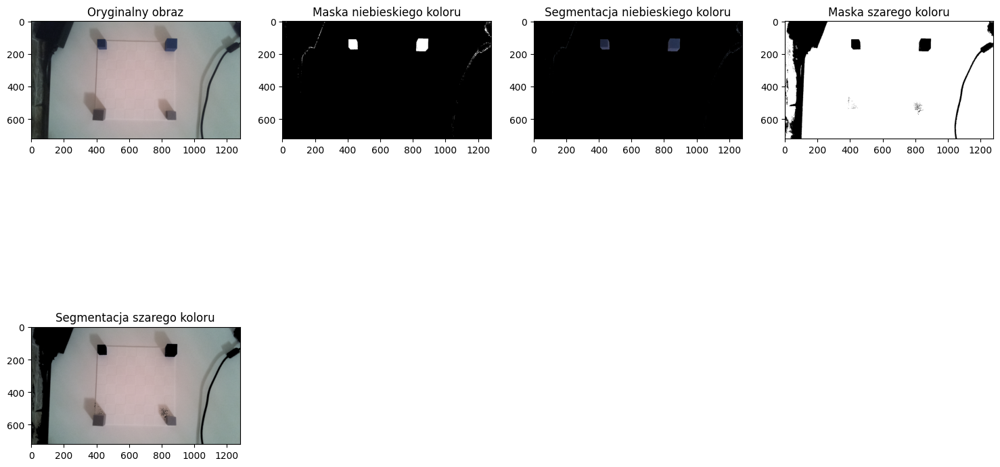

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie1.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do przestrzeni HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Sprawdź zakresy kolorów w obrazie HSV
    hue_min, hue_max = hsv_image[:,:,0].min(), hsv_image[:,:,0].max()
    saturation_min, saturation_max = hsv_image[:,:,1].min(), hsv_image[:,:,1].max()
    value_min, value_max = hsv_image[:,:,2].min(), hsv_image[:,:,2].max()

    print("Zakresy kolorów HSV w obrazie:")
    print(f"Hue min: {hue_min}, max: {hue_max}")
    print(f"Saturation min: {saturation_min}, max: {saturation_max}")
    print(f"Value min: {value_min}, max: {value_max}")

    # Definiowanie zakresów kolorów
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([140, 255, 255])

    lower_gray = np.array([0, 0, 50])
    upper_gray = np.array([180, 50, 255])

    # Utworzenie masek dla poszczególnych kolorów
    mask_blue = cv2.inRange(hsv_image, lower_blue, upper_blue)
    mask_gray = cv2.inRange(hsv_image, lower_gray, upper_gray)

    # Nałożenie masek na obraz
    result_blue = cv2.bitwise_and(image, image, mask=mask_blue)
    result_gray = cv2.bitwise_and(image, image, mask=mask_gray)

    # Wyświetlanie wyników
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 4, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    plt.subplot(2, 4, 2)
    plt.title('Maska niebieskiego koloru')
    plt.imshow(mask_blue, cmap='gray')

    plt.subplot(2, 4, 3)
    plt.title('Segmentacja niebieskiego koloru')
    plt.imshow(cv2.cvtColor(result_blue, cv2.COLOR_BGR2RGB))

    plt.subplot(2, 4, 4)
    plt.title('Maska szarego koloru')
    plt.imshow(mask_gray, cmap='gray')

    plt.subplot(2, 4, 5)
    plt.title('Segmentacja szarego koloru')
    plt.imshow(cv2.cvtColor(result_gray, cv2.COLOR_BGR2RGB))

    plt.tight_layout()
    plt.show()


## **2. HSV test2**
Maska i segmentacja plus obrys konturu

Zakresy kolorów HSV w obrazie:
Hue min: 0, max: 179
Saturation min: 0, max: 213
Value min: 10, max: 211


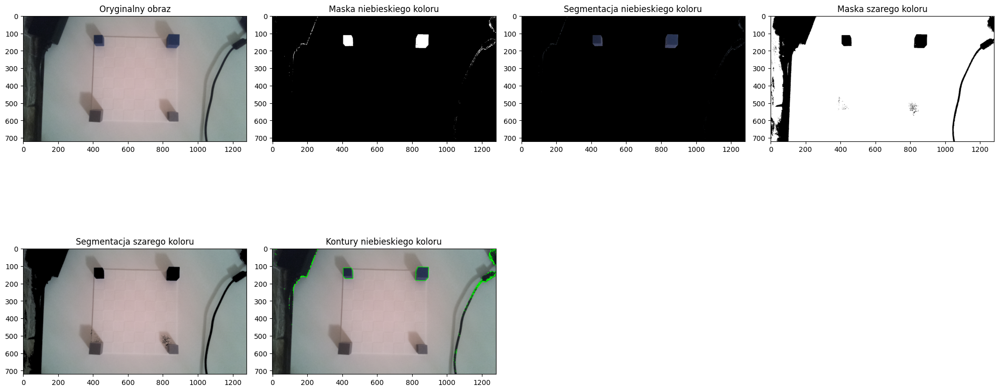

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie1.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do przestrzeni HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Sprawdź zakresy kolorów w obrazie HSV
    hue_min, hue_max = hsv_image[:,:,0].min(), hsv_image[:,:,0].max()
    saturation_min, saturation_max = hsv_image[:,:,1].min(), hsv_image[:,:,1].max()
    value_min, value_max = hsv_image[:,:,2].min(), hsv_image[:,:,2].max()

    print("Zakresy kolorów HSV w obrazie:")
    print(f"Hue min: {hue_min}, max: {hue_max}")
    print(f"Saturation min: {saturation_min}, max: {saturation_max}")
    print(f"Value min: {value_min}, max: {value_max}")

    # Definiowanie zakresów kolorów
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([140, 255, 255])

    lower_gray = np.array([0, 0, 50])
    upper_gray = np.array([180, 50, 255])

    # Utworzenie masek dla poszczególnych kolorów
    mask_blue = cv2.inRange(hsv_image, lower_blue, upper_blue)
    mask_gray = cv2.inRange(hsv_image, lower_gray, upper_gray)

    # Nałożenie masek na obraz
    result_blue = cv2.bitwise_and(image, image, mask=mask_blue)
    result_gray = cv2.bitwise_and(image, image, mask=mask_gray)

    # Znajdowanie konturów na masce koloru niebieskiego
    contours, _ = cv2.findContours(mask_blue, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Kopia oryginalnego obrazu do rysowania konturów
    image_with_contours = image.copy()

    # Rysowanie konturów na obrazie
    cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)  # Zielone kontury

    # Wyświetlanie wyników
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 4, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    plt.subplot(2, 4, 2)
    plt.title('Maska niebieskiego koloru')
    plt.imshow(mask_blue, cmap='gray')

    plt.subplot(2, 4, 3)
    plt.title('Segmentacja niebieskiego koloru')
    plt.imshow(cv2.cvtColor(result_blue, cv2.COLOR_BGR2RGB))

    plt.subplot(2, 4, 4)
    plt.title('Maska szarego koloru')
    plt.imshow(mask_gray, cmap='gray')

    plt.subplot(2, 4, 5)
    plt.title('Segmentacja szarego koloru')
    plt.imshow(cv2.cvtColor(result_gray, cv2.COLOR_BGR2RGB))

    plt.subplot(2, 4, 6)
    plt.title('Kontury niebieskiego koloru')
    plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))

    plt.tight_layout()
    plt.show()


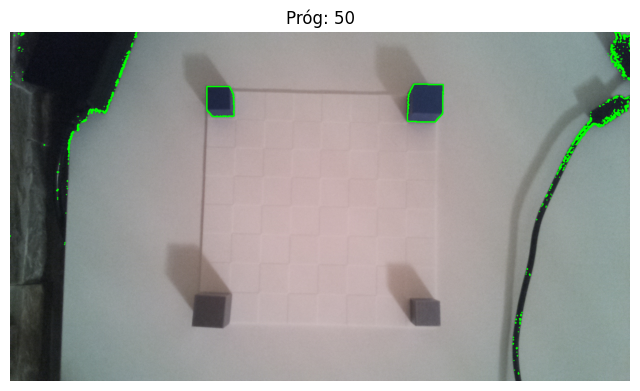

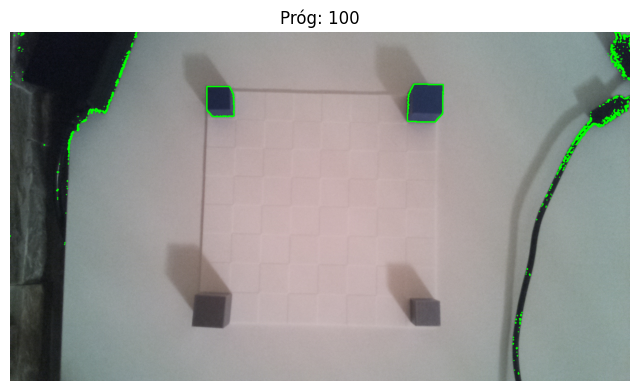

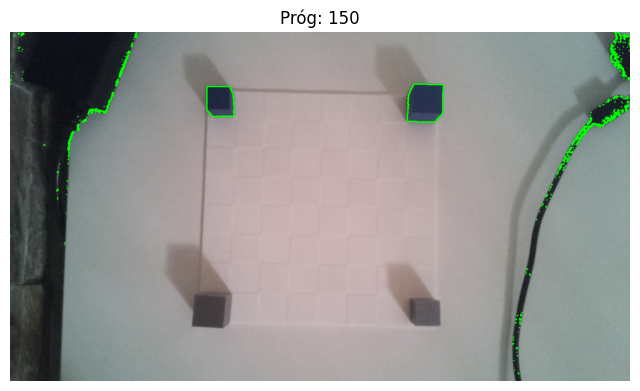

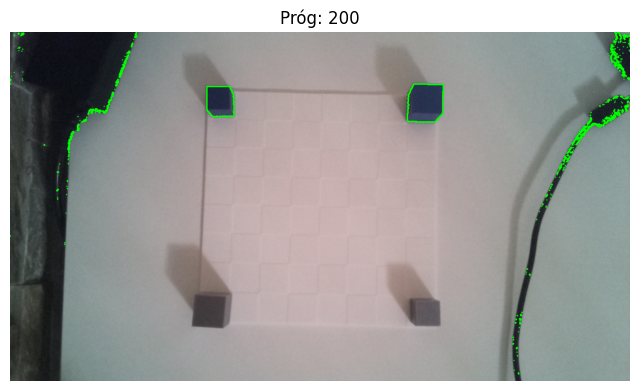

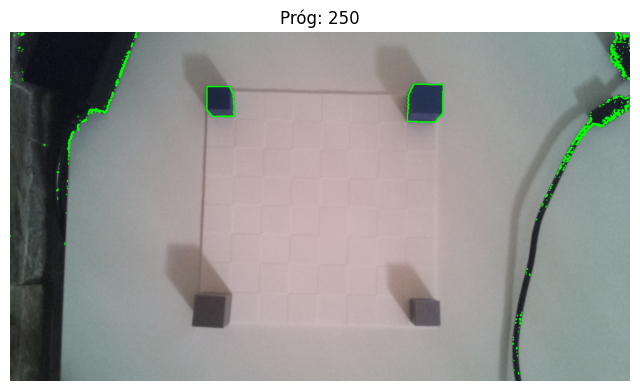

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie1.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do przestrzeni HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Definiowanie zakresu koloru niebieskiego w przestrzeni HSV
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([140, 255, 255])

    # Wykrywanie konturów na masce koloru niebieskiego
    for threshold in range(50, 256, 50):
        mask_blue = cv2.inRange(hsv_image, lower_blue, upper_blue)
        mask_blue_thresholded = cv2.threshold(mask_blue, threshold, 255, cv2.THRESH_BINARY)[1]
        contours, _ = cv2.findContours(mask_blue_thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Rysowanie konturów na oryginalnym obrazie
        image_with_contours = image.copy()
        cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

        # Wyświetlanie wyników
        plt.figure(figsize=(8, 6))
        plt.title(f'Próg: {threshold}')
        plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()


## **3. Rozwiązanie z filtrowaniem szumów (dylatacja i erozja)**

rozne zakresy niebieskiego

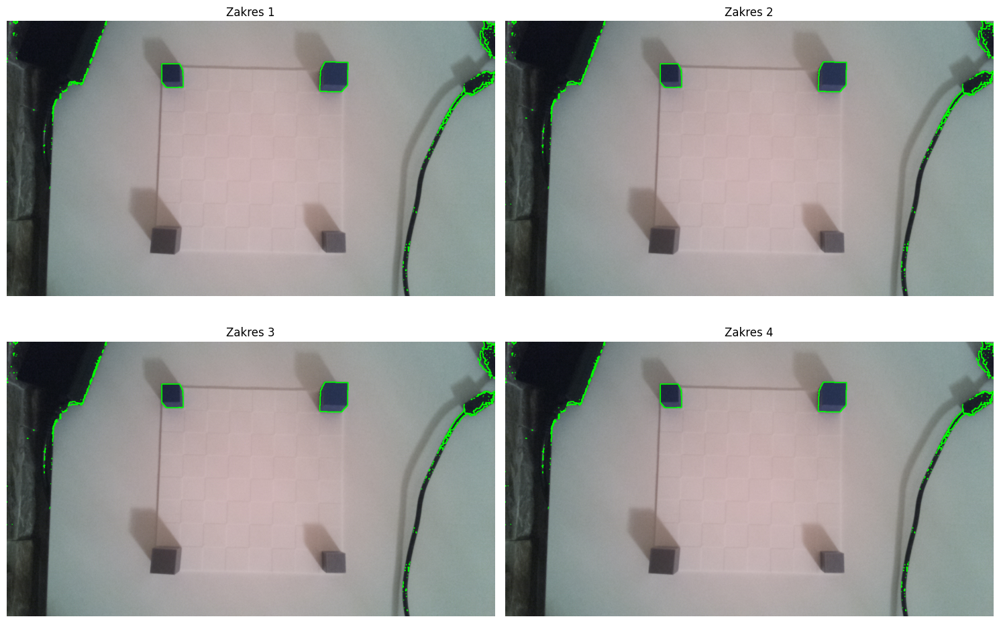

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Wczytaj obraz
image = cv2.imread('/content/images/images/train/zdjecie1.jpg')

# Konwertuj obraz do przestrzeni kolorów HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Zakresy koloru niebieskiego w przestrzeni HSV
blue_ranges = [
    ((100, 50, 50), (140, 255, 255)),
    ((90, 50, 50), (150, 255, 255)),
    ((80, 50, 50), (160, 255, 255)),
    ((70, 50, 50), (170, 255, 255)),
]

# Wielkość jądra dla dylatacji i erozji
kernel_size = (5, 5)

# Wyświetlanie wyników
plt.figure(figsize=(15, 10))

for i, (lower_blue, upper_blue) in enumerate(blue_ranges, 1):
    # Twórz maskę dla koloru niebieskiego
    mask_blue = cv2.inRange(hsv_image, np.array(lower_blue), np.array(upper_blue))

    # Filtrowanie szumów za pomocą dylatacji i erozji
    kernel = np.ones(kernel_size, np.uint8)
    mask_blue_filtered = cv2.dilate(mask_blue, kernel, iterations=1)
    mask_blue_filtered = cv2.erode(mask_blue_filtered, kernel, iterations=1)

    # Wykrywanie konturów na masce koloru niebieskiego
    contours, _ = cv2.findContours(mask_blue_filtered, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Rysowanie konturów na oryginalnym obrazie
    image_with_contours = image.copy()
    cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

    # Wyświetlanie wyników
    plt.subplot(2, 2, i)
    plt.title(f'Zakres {i}')
    plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
    plt.axis('off')

plt.tight_layout()
plt.show()


## **3.1. Rozwiązanie z filtrowaniem szumów (dylatacja i erozja)**

rozne zakresy szumów

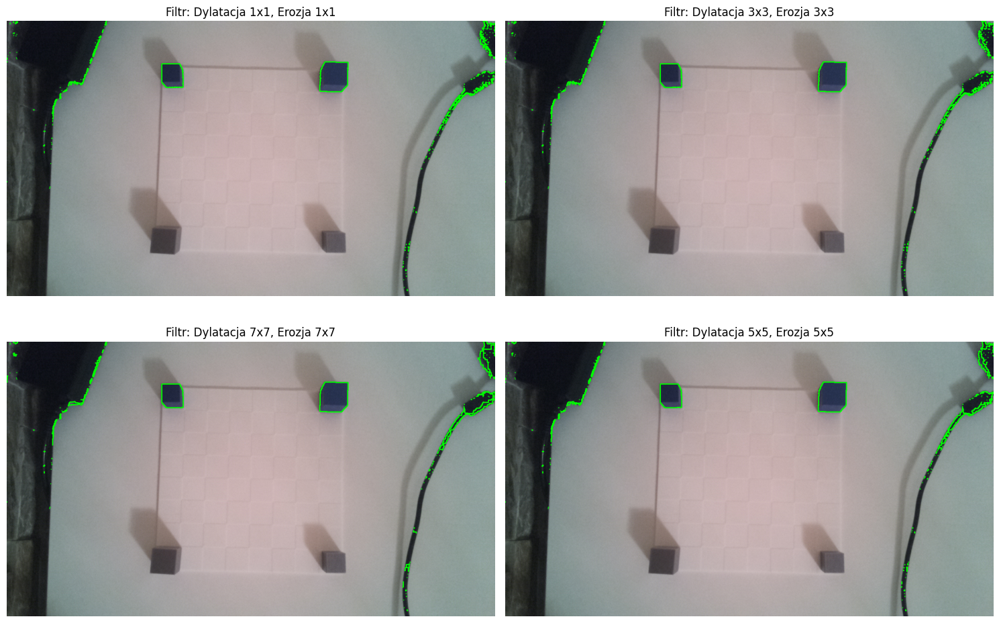

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Wczytaj obraz
image = cv2.imread('/content/images/images/train/zdjecie1.jpg')

# Konwertuj obraz do przestrzeni kolorów HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Podstawowy zakres koloru niebieskiego w przestrzeni HSV
lower_blue_base = np.array([100, 50, 50])
upper_blue_base = np.array([140, 255, 255])

# Definiuj różne zakresy dla szumów
noise_ranges = [
    (1, 1),   # Bez filtra (oryginalny obraz)
    (3, 3),   # Dylatacja i erozja z mniejszym jądrem
    (7, 7),   # Dylatacja i erozja z większym jądrem
    (5, 5),   # Dylatacja i erozja z jądrem o średniej wielkości
]

# Wyświetlanie wyników
plt.figure(figsize=(15, 10))

for i, (dilate_size, erode_size) in enumerate(noise_ranges, 1):
    # Twórz maskę dla koloru niebieskiego
    mask_blue = cv2.inRange(hsv_image, lower_blue_base, upper_blue_base)

    # Filtrowanie szumów za pomocą dylatacji i erozji
    kernel_dilate = np.ones((dilate_size, dilate_size), np.uint8)
    kernel_erode = np.ones((erode_size, erode_size), np.uint8)
    mask_blue_filtered = cv2.dilate(mask_blue, kernel_dilate, iterations=1)
    mask_blue_filtered = cv2.erode(mask_blue_filtered, kernel_erode, iterations=1)

    # Wykrywanie konturów na masce koloru niebieskiego
    contours, _ = cv2.findContours(mask_blue_filtered, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Rysowanie konturów na oryginalnym obrazie
    image_with_contours = image.copy()
    cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

    # Wyświetlanie wyników
    plt.subplot(2, 2, i)
    plt.title(f'Filtr: Dylatacja {dilate_size}x{dilate_size}, Erozja {erode_size}x{erode_size}')
    plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
    plt.axis('off')

plt.tight_layout()
plt.show()


## **4. Rozwiązanie z filtrowaniem szumów (mediana)**


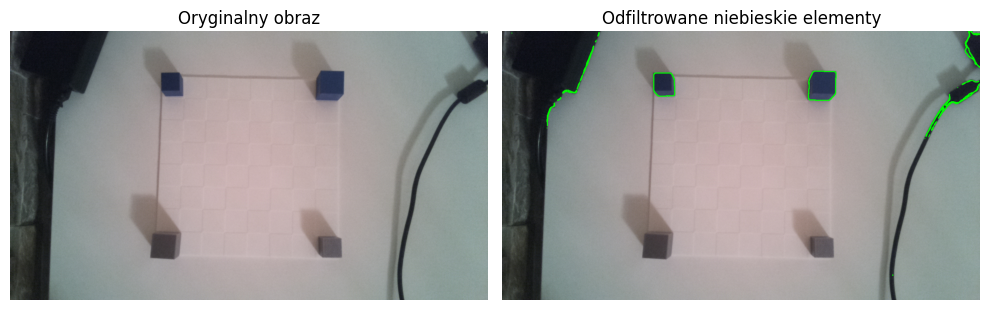

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Wczytaj obraz
image = cv2.imread('/content/images/images/train/zdjecie1.jpg')

# Konwertuj obraz do przestrzeni kolorów HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Filtracja medianowa dla redukcji szumów
median_filtered = cv2.medianBlur(hsv_image, 9)  # Rozmiar filtra: 5x5

# Podstawowy zakres koloru niebieskiego w przestrzeni HSV
lower_blue_base = np.array([100, 50, 50])
upper_blue_base = np.array([140, 255, 255])

# Twórz maskę dla koloru niebieskiego
mask_blue = cv2.inRange(median_filtered, lower_blue_base, upper_blue_base)

# Wykrywanie konturów na masce koloru niebieskiego
contours, _ = cv2.findContours(mask_blue, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Rysowanie konturów na oryginalnym obrazie
image_with_contours = image.copy()
cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

# Wyświetlanie wyników
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.title('Oryginalny obraz')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Odfiltrowane niebieskie elementy')
plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


## **5. Rozwiązanie z filtrowaniem gaussowskim**

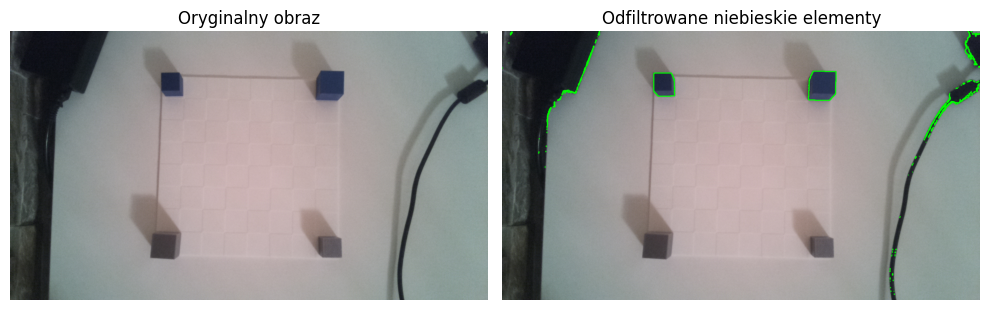

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Wczytaj obraz
image = cv2.imread('/content/images/images/train/zdjecie1.jpg')

# Konwertuj obraz do przestrzeni kolorów HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Filtracja Gaussowska dla redukcji szumów
gaussian_filtered = cv2.GaussianBlur(hsv_image, (5, 5), 0)  # Rozmiar filtra: 5x5

# Podstawowy zakres koloru niebieskiego w przestrzeni HSV
lower_blue_base = np.array([100, 50, 50])
upper_blue_base = np.array([140, 255, 255])

# Twórz maskę dla koloru niebieskiego
mask_blue = cv2.inRange(gaussian_filtered, lower_blue_base, upper_blue_base)

# Wykrywanie konturów na masce koloru niebieskiego
contours, _ = cv2.findContours(mask_blue, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Rysowanie konturów na oryginalnym obrazie
image_with_contours = image.copy()
cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

# Wyświetlanie wyników
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.title('Oryginalny obraz')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Odfiltrowane niebieskie elementy')
plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


## **6. Rozwiązanie z segmentacją adaptacyjną**

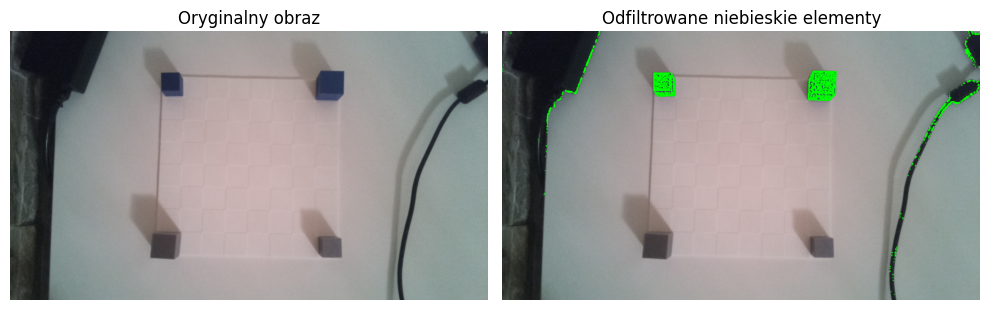

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Wczytaj obraz
image = cv2.imread('/content/images/images/train/zdjecie1.jpg')

# Konwertuj obraz do przestrzeni kolorów HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Zastosuj segmentację adaptacyjną do uzyskania maski
adaptive_mask = cv2.adaptiveThreshold(hsv_image[:,:,2], 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

# Podstawowy zakres koloru niebieskiego w przestrzeni HSV
lower_blue_base = np.array([100, 50, 50])
upper_blue_base = np.array([140, 255, 255])

# Twórz maskę dla koloru niebieskiego
mask_blue = cv2.inRange(hsv_image, lower_blue_base, upper_blue_base)

# Połącz maskę z segmentacją adaptacyjną
mask_combined = cv2.bitwise_and(mask_blue, adaptive_mask)

# Wykrywanie konturów na połączonej masce
contours, _ = cv2.findContours(mask_combined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Rysowanie konturów na oryginalnym obrazie
image_with_contours = image.copy()
cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

# Wyświetlanie wyników
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.title('Oryginalny obraz')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Odfiltrowane niebieskie elementy')
plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


## **7. Rozwiązanie z filtracją kontekstową**

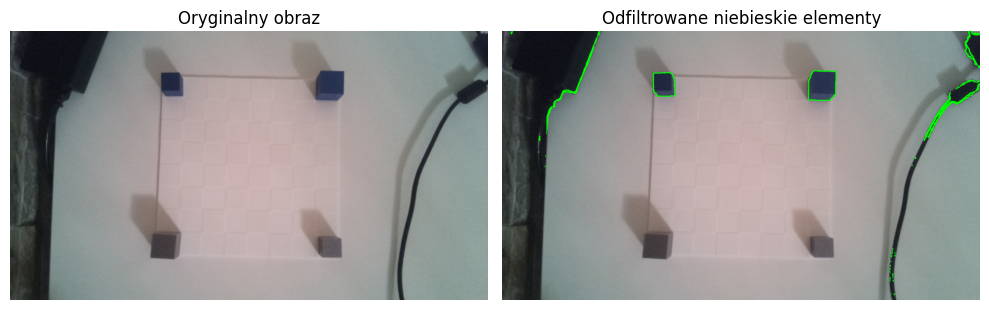

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Wczytaj obraz
image = cv2.imread('/content/images/images/train/zdjecie1.jpg')

# Konwertuj obraz do przestrzeni kolorów HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Zastosuj filtrację bilateralną do uzyskania wygładzonego obrazu
bilateral_filtered = cv2.bilateralFilter(hsv_image, 9, 75, 75)

# Podstawowy zakres koloru niebieskiego w przestrzeni HSV
lower_blue_base = np.array([100, 50, 50])
upper_blue_base = np.array([140, 255, 255])

# Twórz maskę dla koloru niebieskiego
mask_blue = cv2.inRange(bilateral_filtered, lower_blue_base, upper_blue_base)

# Wykrywanie konturów na masce koloru niebieskiego
contours, _ = cv2.findContours(mask_blue, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Rysowanie konturów na oryginalnym obrazie
image_with_contours = image.copy()
cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

# Wyświetlanie wyników
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.title('Oryginalny obraz')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Odfiltrowane niebieskie elementy')
plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


## **8. Dodanie algorytmu Canniego**

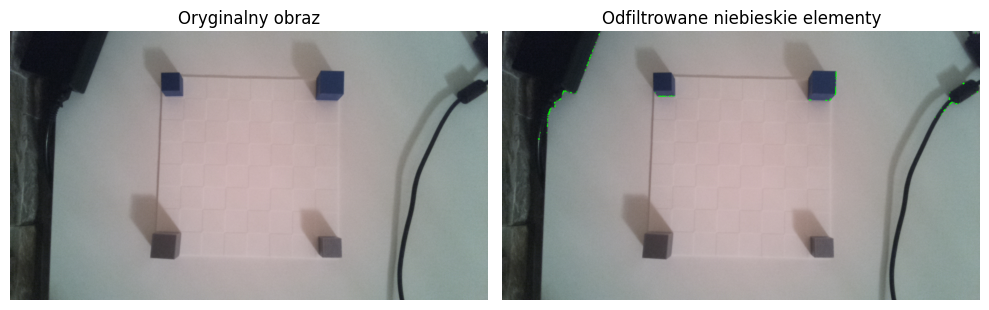

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Wczytaj obraz
image = cv2.imread('/content/images/images/train/zdjecie1.jpg')

# Konwertuj obraz do przestrzeni kolorów HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Zastosuj algorytm Canny'ego do uzyskania krawędzi obiektów
edges = cv2.Canny(hsv_image[:,:,2], 100, 200)

# Podstawowy zakres koloru niebieskiego w przestrzeni HSV
lower_blue_base = np.array([100, 50, 50])
upper_blue_base = np.array([140, 255, 255])

# Twórz maskę dla koloru niebieskiego
mask_blue = cv2.inRange(hsv_image, lower_blue_base, upper_blue_base)

# Połącz maskę z krawędziami
mask_combined = cv2.bitwise_and(mask_blue, edges)

# Wykrywanie konturów na połączonej masce
contours, _ = cv2.findContours(mask_combined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Rysowanie konturów na oryginalnym obrazie
image_with_contours = image.copy()
cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

# Wyświetlanie wyników
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.title('Oryginalny obraz')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Odfiltrowane niebieskie elementy')
plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


## **9. Wykrywanie powierzchni prostopadłych - transformacja Hougha**

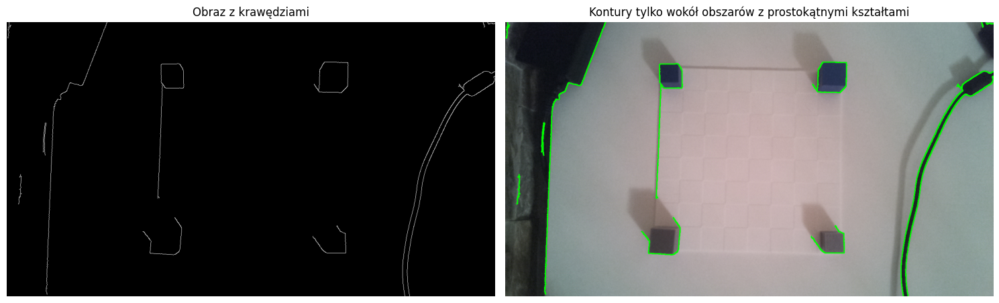

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie1.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do skali szarości
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Zastosuj detekcję krawędzi
    edges = cv2.Canny(gray_image, 50, 150)

    # Wykrywanie prostokątnych kształtów za pomocą transformacji Hougha
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, minLineLength=100, maxLineGap=10)

    # Inicjalizacja pustej listy dla prostokątnych kształtów
    rectangles = []

    # Pętla po wszystkich wykrytych liniach
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            # Sprawdź czy linia jest wystarczająco długa (linie krótsze będą ignorowane)
            length = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
            if length > 50:
                rectangles.append(line)

    # Rysowanie konturów tylko dla obszarów z prostokątnymi kształtami
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    image_with_contours = image.copy()
    cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

    # Wyświetlanie wyników
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 2, 1)
    plt.title('Obraz z krawędziami')
    plt.imshow(edges, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Kontury tylko wokół obszarów z prostokątnymi kształtami')
    plt.imshow(cv2.cvtColor(image_with_contours, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()


## **10. Określenie zakresów dla poszczególnych kolorów**

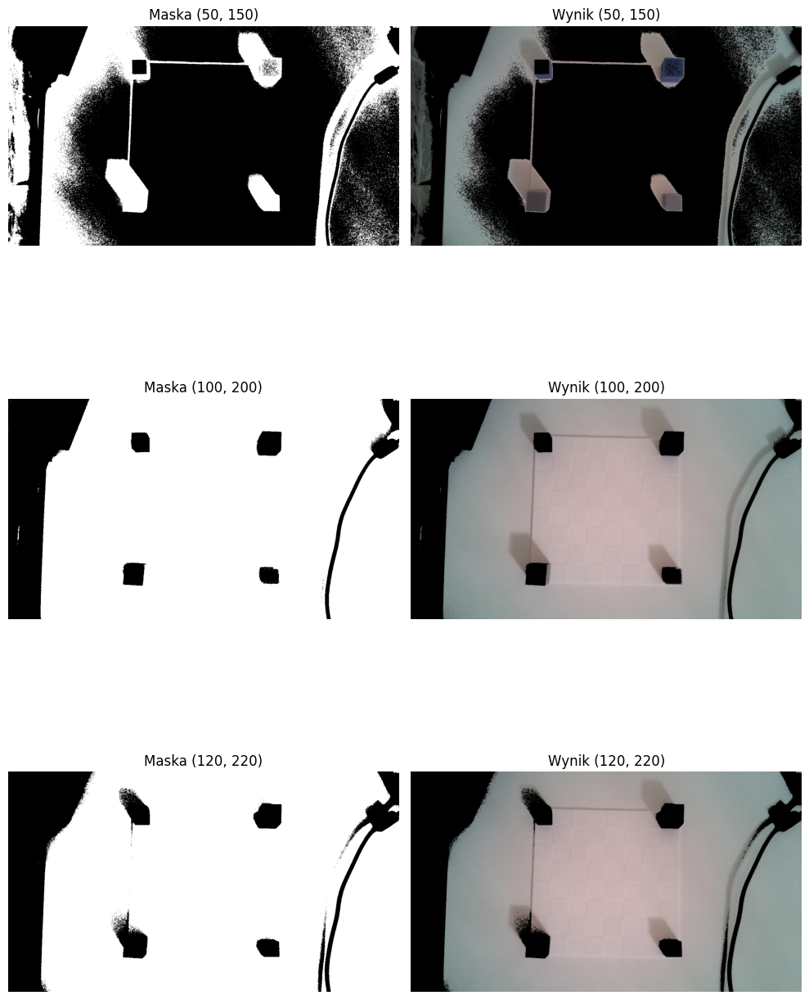

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie1.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do odcieni szarości
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Definiowanie różnych zestawów progów dla koloru szarego
    gray_thresholds = [
        (50, 150),  # Przykład zakresu szarego
        (100, 200),  # Inny przykład zakresu szarego
        (120, 220)   # Jeszcze inny przykład zakresu szarego
    ]

    # Przetwarzanie obrazu przy użyciu różnych progów
    fig, axes = plt.subplots(len(gray_thresholds), 2, figsize=(10, 5 * len(gray_thresholds)))
    for idx, (lower, upper) in enumerate(gray_thresholds):
        # Utworzenie maski na podstawie zakresów szarości
        mask = cv2.inRange(gray_image, lower, upper)
        result = cv2.bitwise_and(image, image, mask=mask)

        # Wyświetlenie maski i wynikowego obrazu
        axes[idx, 0].imshow(mask, cmap='gray')
        axes[idx, 0].set_title(f'Maska ({lower}, {upper})')
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        axes[idx, 1].set_title(f'Wynik ({lower}, {upper})')
        axes[idx, 1].axis('off')

    plt.tight_layout()
    plt.show()


## **=============TEST=============**

### Rysowanie konturu w obrębie deklarowanego przedziału

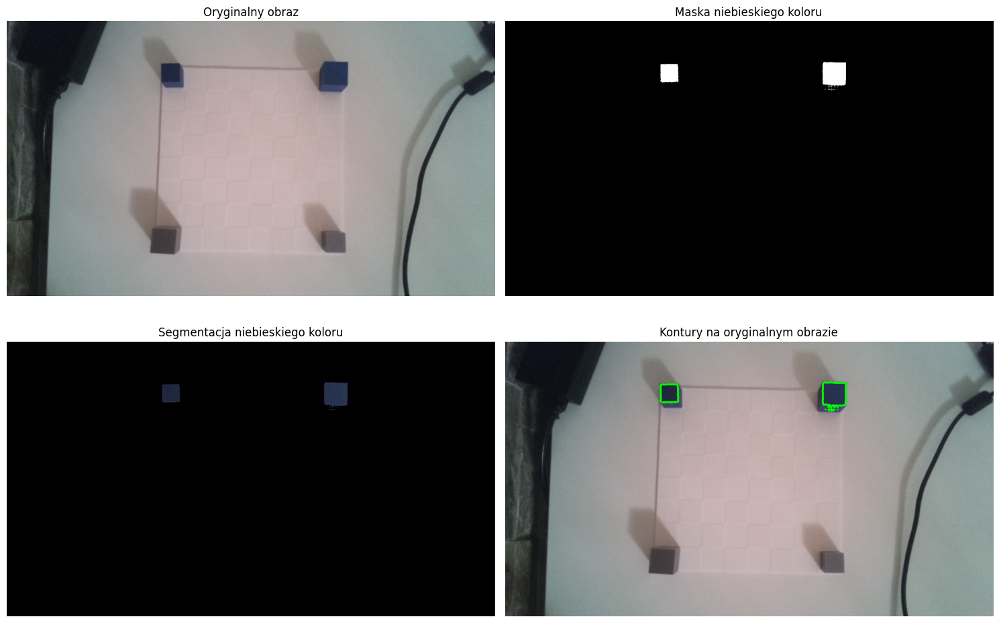

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie1.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do przestrzeni HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Definiowanie zakresów kolorów
    lower_blue = np.array([100, 100, 50])
    upper_blue = np.array([140, 255, 255])

    # Utworzenie maski na podstawie zakresów kolorów
    mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Znajdowanie konturów
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Rysowanie konturów na oryginalnym obrazie
    contoured_image = image.copy()
    cv2.drawContours(contoured_image, contours, -1, (0, 255, 0), 3)  # Rysowanie konturów kolorem zielonym

    # Wyświetlanie wyników
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.title('Maska niebieskiego koloru')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.title('Segmentacja niebieskiego koloru')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.title('Kontury na oryginalnym obrazie')
    plt.imshow(cv2.cvtColor(contoured_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()


### Rysowanie konturu w obrębie deklarowanego przedziału + odsiewanie elementów zbędnych

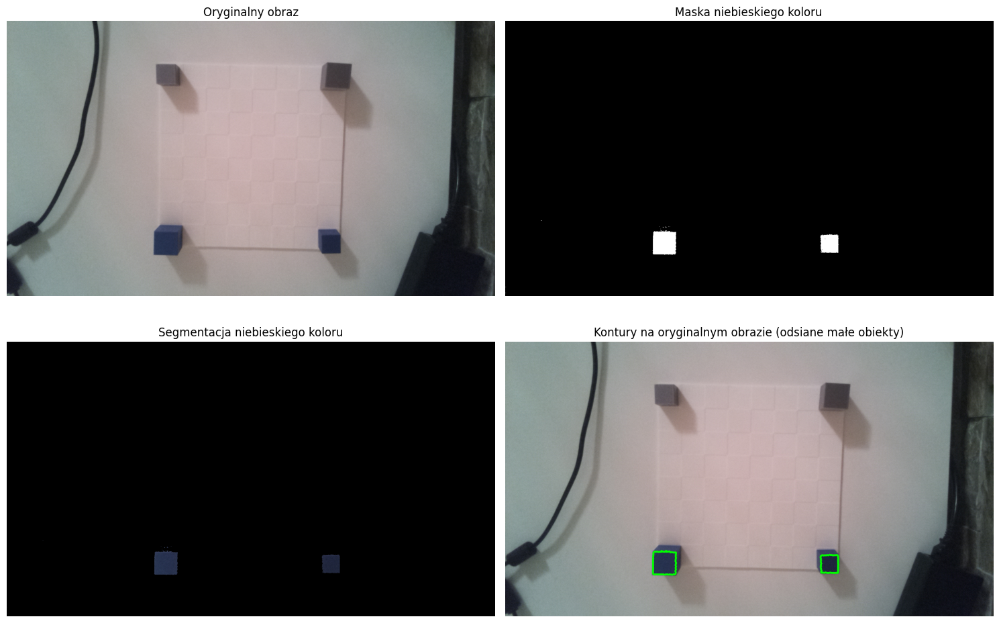

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie2.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do przestrzeni HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Definiowanie zakresów kolorów
    lower_blue = np.array([100, 100, 50])
    upper_blue = np.array([140, 255, 255])

    # Utworzenie maski na podstawie zakresów kolorów
    mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Znajdowanie konturów
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Odsiewanie małych konturów
    min_contour_area = 500  # Minimalna powierzchnia konturu, aby go zachować
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) >= min_contour_area]

    # Rysowanie konturów na oryginalnym obrazie
    contoured_image = image.copy()
    cv2.drawContours(contoured_image, filtered_contours, -1, (0, 255, 0), 3)  # Rysowanie konturów kolorem zielonym

    # Wyświetlanie wyników
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.title('Maska niebieskiego koloru')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.title('Segmentacja niebieskiego koloru')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.title('Kontury na oryginalnym obrazie (odsiane małe obiekty)')
    plt.imshow(cv2.cvtColor(contoured_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()


## Rysowanie kontury wraz z dodatkowymi parametrami





Środek konturu: (861, 585)
Pole konturu: 4162.0
Środek konturu: (406, 571)
Pole konturu: 2443.0


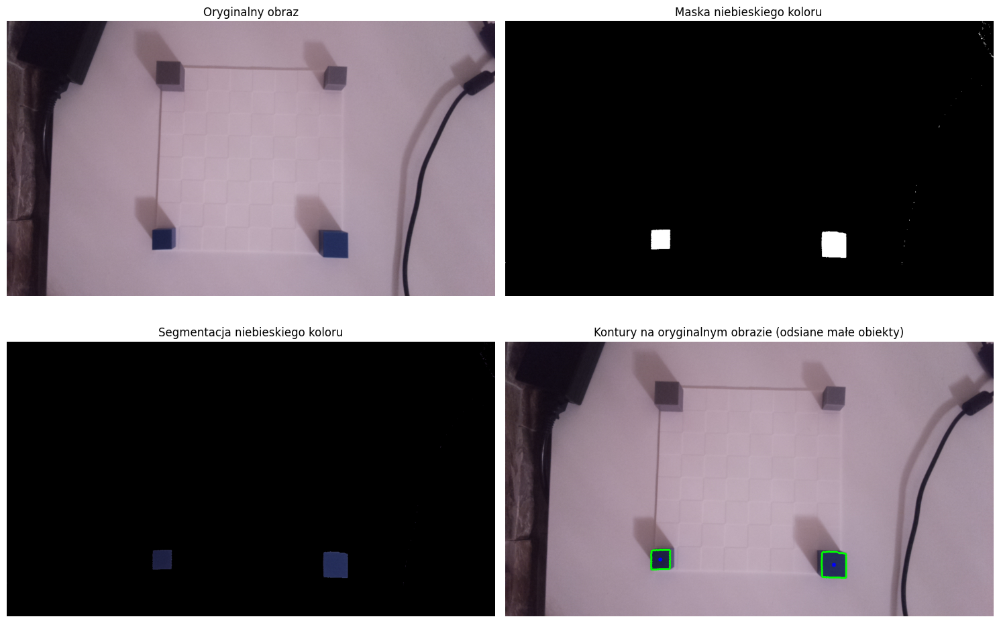

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie6.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do przestrzeni HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Definiowanie zakresów kolorów
    lower_blue = np.array([100, 100, 50])
    upper_blue = np.array([140, 255, 255])

    # Utworzenie maski na podstawie zakresów kolorów
    mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Znajdowanie konturów
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Odsiewanie małych konturów
    min_contour_area = 500  # Minimalna powierzchnia konturu, aby go zachować
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) >= min_contour_area]

    # Rysowanie konturów na oryginalnym obrazie
    contoured_image = image.copy()
    cv2.drawContours(contoured_image, filtered_contours, -1, (0, 255, 0), 3)  # Rysowanie konturów kolorem zielonym

    # Dodanie zaznaczenia środka konturu
    for cnt in filtered_contours:
        # Obliczenie momentów konturu
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            # Obliczenie współrzędnych środka konturu
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])

            # Rysowanie kółka w miejscu środka konturu
            cv2.circle(contoured_image, (cx, cy), 5, (255, 0, 0), -1)

            # Obliczenie pola konturu
            area = cv2.contourArea(cnt)

            # Wyświetlenie współrzędnych środka i pola konturu
            print(f'Środek konturu: ({cx}, {cy})')
            print(f'Pole konturu: {area}')

    # Wyświetlanie wyników
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.title('Maska niebieskiego koloru')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.title('Segmentacja niebieskiego koloru')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.title('Kontury na oryginalnym obrazie (odsiane małe obiekty)')
    plt.imshow(cv2.cvtColor(contoured_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()


## TEST - rozjaśnienie obrazu

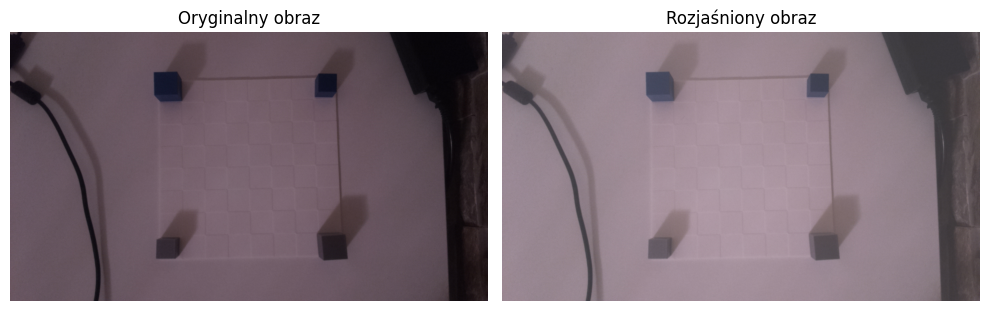

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie4.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Dodaj stałą wartość do każdego piksela obrazu (np. 50)
    brightness = 50
    brightened_image = np.clip(image.astype(int) + brightness, 0, 255).astype(np.uint8)

    # Wyświetl oryginalny i rozjaśniony obraz
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Rozjaśniony obraz')
    plt.imshow(cv2.cvtColor(brightened_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()


## Rozjaśnienie na wstępie a następnie rysowanie konturów

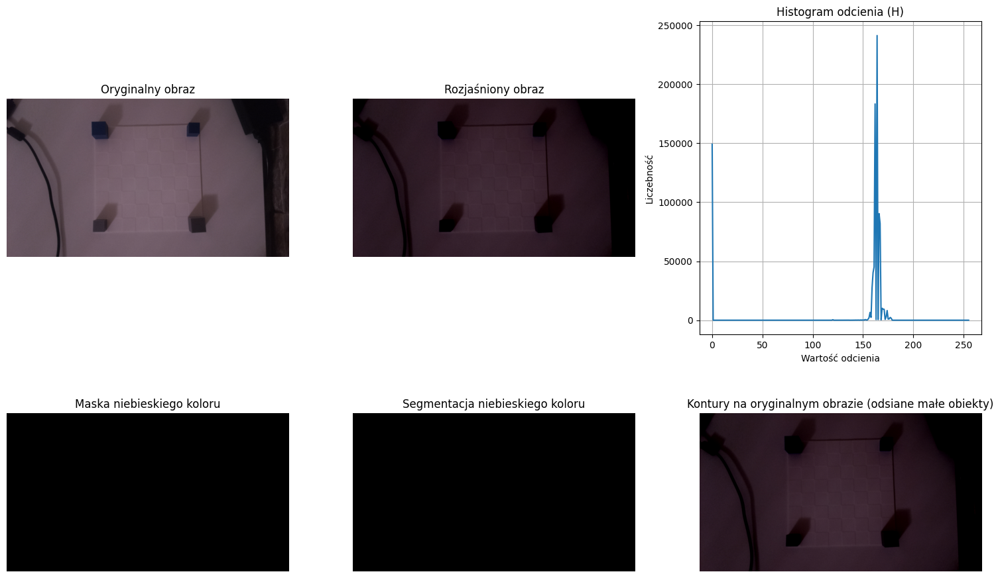

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def adjust_brightness(image, brightness, hue_threshold, target_hue, max_iterations=10):
    """
    Dostosowuje jasność obrazu w celu utrzymania koloru w określonym zakresie odcienia.

    Args:
        image (numpy.ndarray): Obraz wejściowy.
        brightness (int): Wartość do dodania do każdego piksela obrazu w celu rozjaśnienia.
        hue_threshold (int): Próg odcienia, poza którym będziemy dostosowywać jasność.
        target_hue (int): Docelowy odcień, który chcemy zachować.
        max_iterations (int, optional): Maksymalna liczba iteracji dostosowywania jasności. Domyślnie 10.

    Returns:
        numpy.ndarray: Rozjaśniony obraz z zachowanym kolorowaniem w określonym zakresie odcienia.
    """
    # Skopiuj oryginalny obraz, aby uniknąć zmiany oryginalnego obrazu
    brightened_image = image.copy()

    # Iteracyjnie dostosuj jasność, sprawdzając odcień i dostosowując wartość jasności, jeśli odcień jest poza zakresem
    for i in range(max_iterations):
        # Rozjaśnienie obrazu
        brightened_image = np.clip(image.astype(int) + brightness, 0, 255).astype(np.uint8)

        # Konwertuj obraz do przestrzeni kolorów HSV
        hsv_image = cv2.cvtColor(brightened_image, cv2.COLOR_BGR2HSV)

        # Oblicz średni odcień w obszarze zainteresowania
        hue_mean = np.mean(hsv_image[:,:,0])

        # Sprawdź, czy odcień jest poza docelowym zakresem
        if abs(target_hue - hue_mean) > hue_threshold:
            # Dostosuj wartość jasności w odpowiednim kierunku
            if hue_mean < target_hue:
                brightness += 10
            else:
                brightness -= 10
        else:
            # Odcień jest w odpowiednim zakresie, zakończ pętlę
            break

    return brightened_image

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie4.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Dostosuj jasność obrazu w celu zachowania koloru niebieskiego w określonym zakresie odcienia
    brightened_image = adjust_brightness(image, brightness=0, hue_threshold=20, target_hue=120)

    # Konwertuj obraz do przestrzeni kolorów HSV
    hsv_image = cv2.cvtColor(brightened_image, cv2.COLOR_BGR2HSV)

    # Oblicz histogramy kanałów HSV
    h_hist = cv2.calcHist([hsv_image], [0], None, [256], [0, 256])
    s_hist = cv2.calcHist([hsv_image], [1], None, [256], [0, 256])
    v_hist = cv2.calcHist([hsv_image], [2], None, [256], [0, 256])

    # Definiowanie zakresów kolorów
    lower_blue = np.array([100, 100, 50])
    upper_blue = np.array([140, 255, 255])

    # Utworzenie maski na podstawie zakresów kolorów
    mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    result = cv2.bitwise_and(brightened_image, brightened_image, mask=mask)

    # Znajdowanie konturów
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Odsiewanie małych konturów
    min_contour_area = 500  # Minimalna powierzchnia konturu, aby go zachować
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) >= min_contour_area]

    # Rysowanie konturów na oryginalnym obrazie
    contoured_image = brightened_image.copy()
    cv2.drawContours(contoured_image, filtered_contours, -1, (0, 255, 0), 3)  # Rysowanie konturów kolorem zielonym

    # Dodanie zaznaczenia środka konturu
    for cnt in filtered_contours:
        # Obliczenie momentów konturu
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            # Obliczenie współrzędnych środka konturu
              cx = int(M["m10"] / M["m00"])
              cy = int(M["m01"] / M["m00"])

              # Rysowanie kółka w miejscu środka konturu
              cv2.circle(contoured_image, (cx, cy), 5, (255, 0, 0), -1)

              # Obliczenie pola konturu
              area = cv2.contourArea(cnt)

              # Wyświetlenie współrzędnych środka i pola konturu
              print(f'Środek konturu: ({cx}, {cy})')
              print(f'Pole konturu: {area}')

    # Wyświetlanie wyników
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.title('Rozjaśniony obraz')
    plt.imshow(cv2.cvtColor(brightened_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.title('Histogram odcienia (H)')
    plt.plot(h_hist)
    plt.xlabel('Wartość odcienia')
    plt.ylabel('Liczebność')
    plt.grid(True)

    plt.subplot(2, 3, 4)
    plt.title('Maska niebieskiego koloru')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.title('Segmentacja niebieskiego koloru')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.title('Kontury na oryginalnym obrazie (odsiane małe obiekty)')
    plt.imshow(cv2.cvtColor(contoured_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()



# **POPRAWNE WYKRYWANIE ELEMENTÓW - NIEBIESKI**

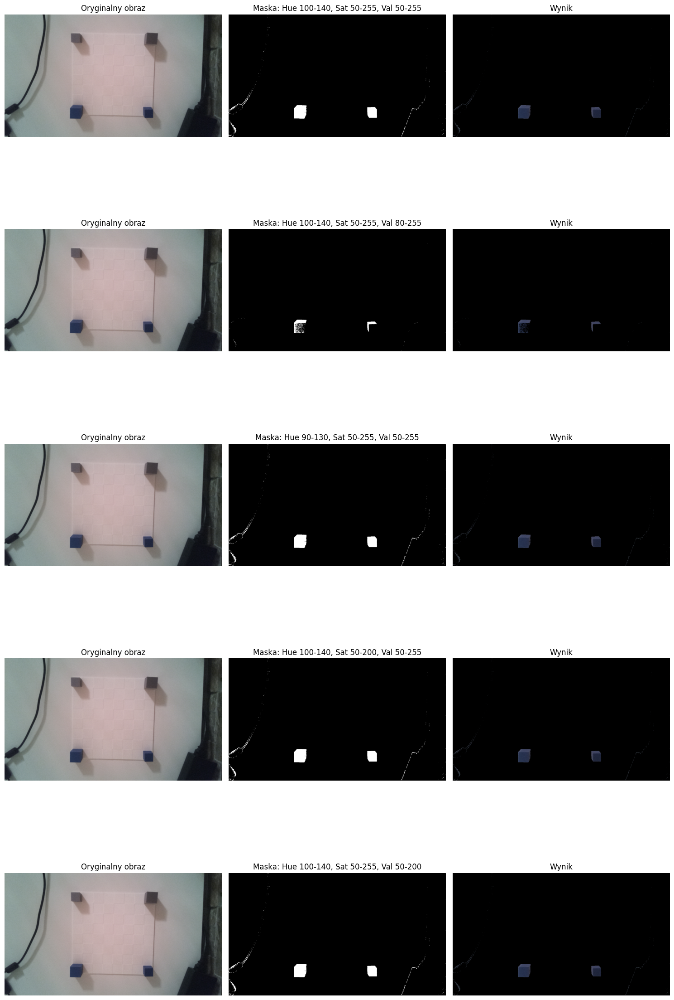

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ścieżka do obrazu
image_path = '/content/images/images/train/zdjecie2.jpg'

# Wczytaj obraz
image = cv2.imread(image_path)

# Sprawdź czy obraz został wczytany poprawnie
if image is None:
    print("Nie udało się wczytać obrazu")
else:
    # Konwertuj obraz do przestrzeni HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Definiowanie zakresów kolorów
    lower_blue = np.array([100, 100, 50])
    upper_blue = np.array([140, 255, 255])

    # Utworzenie maski na podstawie zakresów kolorów
    mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Znajdowanie konturów
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Odsiewanie małych konturów
    min_contour_area = 500  # Minimalna powierzchnia konturu, aby go zachować
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) >= min_contour_area]

    # Rysowanie konturów na oryginalnym obrazie
    contoured_image = image.copy()
    cv2.drawContours(contoured_image, filtered_contours, -1, (0, 255, 0), 3)  # Rysowanie konturów kolorem zielonym

    # Wyświetlanie wyników
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.title('Oryginalny obraz')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.title('Maska niebieskiego koloru')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.title('Segmentacja niebieskiego koloru')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.title('Kontury na oryginalnym obrazie (odsiane małe obiekty)')
    plt.imshow(cv2.cvtColor(contoured_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()
